In [ ]:
# ============================================================
# 1. IMPORTS AND CONFIGURATION
# ============================================================

import os
import shutil
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from google.colab import drive

from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    precision_recall_fscore_support,
    accuracy_score,
    roc_curve,
    auc
)

from sklearn.preprocessing import label_binarize

from scipy.stats import wilcoxon
from statsmodels.stats.contingency_tables import mcnemar

import seaborn as sns


# ============================================================
# 2. GOOGLE DRIVE
# ============================================================

drive.mount('/content/drive')


# ============================================================
# 3. GPU AND MIXED PRECISION
# ============================================================

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("GPU detected:", gpus)
    tf.keras.mixed_precision.set_global_policy('mixed_float16')
    print("Mixed precision enabled")
else:
    print("WARNING: GPU not detected. Training will be slow.")


# ============================================================
# 4. CONFIGURATION
# ============================================================

IMG_SIZE = 224
BATCH_SIZE = 32
SEED = 42

BASE_PHASE1_EPOCHS = 10
BASE_PHASE2_EPOCHS = 25

MAMBA_PHASE1_EPOCHS = 10
MAMBA_PHASE2_EPOCHS = 25

TRAIN_RATIO = 0.70
VAL_RATIO = 0.10
TEST_RATIO = 0.20

DRIVE_DATA_PATH = '/content/drive/MyDrive/cotton_dataset'
LOCAL_DATA_PATH = '/content/cotton_weed_local'

BASE_SAVE_PATH = '/content/drive/MyDrive/EfficientNetB0_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/EfficientNetB0_Cotton_Mamba.keras'

os.makedirs(os.path.dirname(MAMBA_SAVE_PATH), exist_ok=True)


# ============================================================
# 5. COPY DATASET TO COLAB LOCAL STORAGE
# ============================================================

if not os.path.exists(LOCAL_DATA_PATH):
    print("Copying cotton dataset to local Colab storage...")
    shutil.copytree(DRIVE_DATA_PATH, LOCAL_DATA_PATH)
    print("Cotton dataset copied successfully.")
else:
    print("Local cotton dataset already exists.")

base_data_path = LOCAL_DATA_PATH


# ============================================================
# 6-7. STRATIFIED TRAIN/VAL/TEST SPLIT (FILE-LEVEL, NOT BATCH-LEVEL)
# ============================================================
# FIX: The original code shuffled a *batched* dataset before splitting.
# That shuffles batches, not individual images, so classes end up
# unevenly represented across train/val/test -> unstable, lower accuracy
# across runs. This version splits at the file level, per class, so every
# class is exactly 70/10/20 split. This is the single biggest accuracy fix.

IMG_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp', '.tmp'}

data_dir = pathlib.Path(base_data_path)
class_names = sorted([d.name for d in data_dir.iterdir() if d.is_dir()])
num_classes = len(class_names)

print("\nClasses:", class_names)
print("Number of classes:", num_classes)

train_files, val_files, test_files = [], [], []
train_labels, val_labels, test_labels = [], [], []

rng = np.random.default_rng(SEED)

for idx, cls in enumerate(class_names):
    cls_dir = data_dir / cls
    files = sorted([
        str(p) for p in cls_dir.iterdir()
        if p.suffix.lower() in IMG_EXTENSIONS
    ])
    files = np.array(files)
    rng.shuffle(files)

    n = len(files)
    n_train = int(n * TRAIN_RATIO)
    n_val = int(n * VAL_RATIO)
    n_test = n - n_train - n_val  # remainder -> no images dropped

    train_files.extend(files[:n_train]);                train_labels.extend([idx] * n_train)
    val_files.extend(files[n_train:n_train + n_val]);     val_labels.extend([idx] * n_val)
    test_files.extend(files[n_train + n_val:]);           test_labels.extend([idx] * n_test)

train_files = np.array(train_files); train_labels = np.array(train_labels)
val_files = np.array(val_files);     val_labels = np.array(val_labels)
test_files = np.array(test_files);   test_labels = np.array(test_labels)

print("\nDataset split (file-level, stratified per class):")
print("Train images:", len(train_files))
print("Validation images:", len(val_files))
print("Test images:", len(test_files))

steps_per_epoch_train = max(1, len(train_files) // BATCH_SIZE)


def load_and_preprocess(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img.set_shape((IMG_SIZE, IMG_SIZE, 3))
    return img, label


def make_dataset(files, labels, training=False):
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    if training:
        ds = ds.shuffle(buffer_size=len(files), seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE)
    return ds


train_ds = make_dataset(train_files, train_labels, training=True)
val_ds = make_dataset(val_files, val_labels)
test_ds = make_dataset(test_files, test_labels)


# ========= STRATIFIED SPLIT TABLE ===========

def count_images_per_class(data_path):
    class_counts = {}
    for class_name in sorted(os.listdir(data_path)):
        class_dir = os.path.join(data_path, class_name)
        if not os.path.isdir(class_dir):
            continue
        count = sum(
            1 for f in os.listdir(class_dir)
            if os.path.splitext(f)[1].lower() in IMG_EXTENSIONS
        )
        class_counts[class_name] = count
    return class_counts


def compute_split_counts(class_counts, train_ratio, val_ratio, test_ratio):
    split_rows = []
    for class_name, total in class_counts.items():
        train_n = int(total * train_ratio)
        val_n = int(total * val_ratio)
        test_n = total - train_n - val_n
        split_rows.append((class_name, train_n, val_n, test_n, total))
    return split_rows


def print_stratified_report(split_rows):
    total_train = sum(r[1] for r in split_rows)
    total_val = sum(r[2] for r in split_rows)
    total_test = sum(r[3] for r in split_rows)
    total_all = sum(r[4] for r in split_rows)
    n_cls = len(split_rows)

    avg_train = total_train / n_cls if n_cls else 0
    avg_val = total_val / n_cls if n_cls else 0
    avg_test = total_test / n_cls if n_cls else 0

    print("PERFECTLY STRATIFIED DISTRIBUTION")
    print("=" * 60)
    print(f"Training Images   : {total_train:<6} ({avg_train:.1f} per class)")
    print(f"Validation Images : {total_val:<6} ({avg_val:.1f} per class)")
    print(f"Testing Images    : {total_test:<6} ({avg_test:.1f} per class)")
    print(f"Total Images      : {total_all} / {total_all}")
    print()
    print("=" * 78)
    print("CLASS-WISE IMAGE DISTRIBUTION")
    print("=" * 78)

    name_width = max(len(r[0]) for r in split_rows) + 2
    name_width = max(name_width, len("Class") + 2)

    header = (
        f"{'Class':<{name_width}}{'Train':>8}{'Validation':>13}"
        f"{'Test':>8}{'Total':>8}"
    )
    print(header)
    print("-" * len(header))

    for class_name, train_n, val_n, test_n, total in split_rows:
        print(
            f"{class_name:<{name_width}}{train_n:>8}{val_n:>13}"
            f"{test_n:>8}{total:>8}"
        )

    print("-" * len(header))
    print(
        f"{'TOTAL':<{name_width}}{total_train:>8}{total_val:>13}"
        f"{total_test:>8}{total_all:>8}"
    )
    print("=" * 78)


class_counts = count_images_per_class(base_data_path)
split_rows = compute_split_counts(class_counts, TRAIN_RATIO, VAL_RATIO, TEST_RATIO)
print_stratified_report(split_rows)


# ============================================================
# 8. DATA AUGMENTATION (STRENGTHENED)
# ============================================================
# FIX: original augmentation (flip/rotate/zoom only) was too mild for
# real-world lighting/color variation in leaf images. Added contrast and
# brightness jitter.

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.15),
    layers.RandomBrightness(0.15),
], name="data_augmentation")


train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

print("Dataset pipeline ready.")


# ============================================================
# 9. COMMON CALLBACKS
# ============================================================

def get_callbacks(save_path, patience=8):
    return [
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-8,
            verbose=1
        ),

        EarlyStopping(
            monitor='val_loss',
            patience=patience,       # was 6 -> gives fine-tuning more room before stopping
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]


def get_callbacks_cosine(save_path, patience=8):
    # FIX: ReduceLROnPlateau tries to manually overwrite the optimizer's
    # learning_rate, but when the optimizer is built with a
    # LearningRateSchedule (CosineDecay, used in phase 2), Keras raises
    # TypeError because the LR is schedule-driven and not settable.
    # CosineDecay already handles LR decay on its own, so ReduceLROnPlateau
    # is dropped here (not needed, and incompatible).
    return [
        EarlyStopping(
            monitor='val_loss',
            patience=patience,
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]


# ============================================================
# 10. BUILD BASE EFFICIENTNETB0 MODEL
# ============================================================

print("\nBuilding EfficientNetB0 baseline...")

base_model = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

base_model.trainable = False

inputs = layers.Input(
    shape=(IMG_SIZE, IMG_SIZE, 3)
)

x = base_model(
    inputs,
    training=False
)

x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)

x = layers.Dense(
    128,
    activation='relu'
)(x)

x = layers.Dropout(0.3)(x)

outputs = layers.Dense(
    num_classes,
    activation='softmax',
    dtype='float32'
)(x)

model_base = models.Model(
    inputs,
    outputs,
    name='EfficientNetB0_Base'
)


# ============================================================
# 11. BASE MODEL - PHASE 1
# ============================================================

model_base.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-3
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nBASE MODEL - PHASE 1")

base_history_phase1 = model_base.fit(
    train_ds,
    validation_data=val_ds,
    epochs=BASE_PHASE1_EPOCHS
)


# ============================================================
# 12. BASE MODEL - PHASE 2 FINE-TUNING (DEEPER + COSINE LR)
# ============================================================
# FIX: unfreezing only the last 30 layers with a flat 1e-5 LR and
# patience=6 often stops before the model has really adapted. Unfreeze
# more layers, use cosine decay starting a bit higher, add mild label
# smoothing, and give EarlyStopping more patience.

base_model.trainable = True

FINE_TUNE_AT = len(base_model.layers) - 60   # was -30
for layer in base_model.layers[:FINE_TUNE_AT]:
    layer.trainable = False

base_lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-4,
    decay_steps=BASE_PHASE2_EPOCHS * steps_per_epoch_train
)

model_base.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=base_lr_schedule),
    loss='sparse_categorical_crossentropy',   # label_smoothing not supported by
                                               # SparseCategoricalCrossentropy in this TF version
    metrics=['accuracy']
)

print("\nBASE MODEL - PHASE 2")

base_history_phase2 = model_base.fit(
    train_ds,
    validation_data=val_ds,
    epochs=BASE_PHASE2_EPOCHS,
    callbacks=get_callbacks_cosine(BASE_SAVE_PATH, patience=8)
)


# ============================================================
# 13. LOAD BEST BASE MODEL
# ============================================================

model_base = tf.keras.models.load_model(
    BASE_SAVE_PATH
)

base_loss, base_acc = model_base.evaluate(
    test_ds,
    verbose=0
)

print(
    f"\nBase EfficientNetB0 Accuracy: "
    f"{base_acc * 100:.2f}%"
)

Mounted at /content/drive
GPU detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mixed precision enabled
Copying cotton dataset to local Colab storage...
Cotton dataset copied successfully.

Classes: ['Amaranthus viridis', 'Carpetweeds', 'Cleome gynandra', 'Commelina benghalensis', 'Cynodon dactylon', 'Echinochloa colona', 'Morningglory', 'Nutsedge', 'PalmerAmaranth', 'Phyllanthus urinaria', 'Purslane', 'Trianthema portulacastrum', 'cotton']
Number of classes: 13

Dataset split (file-level, stratified per class):
Train images: 4550
Validation images: 650
Test images: 1300
PERFECTLY STRATIFIED DISTRIBUTION
Training Images   : 4550   (350.0 per class)
Validation Images : 650    (50.0 per class)
Testing Images    : 1300   (100.0 per class)
Total Images      : 6500 / 6500

CLASS-WISE IMAGE DISTRIBUTION
Class                         Train   Validation    Test   Total
----------------------------------------------------------------
Amaranthus viridis              35

TypeError: <class 'keras.src.models.functional.Functional'> could not be deserialized properly. Please ensure that components that are Python object instances (layers, models, etc.) returned by `get_config()` are explicitly deserialized in the model's `from_config()` method.

config={'module': 'keras.src.models.functional', 'class_name': 'Functional', 'config': {}, 'registered_name': 'Functional', 'build_config': {'input_shape': None}, 'compile_config': {'optimizer': {'module': 'keras.optimizers', 'class_name': 'Adam', 'config': {'name': 'adam', 'learning_rate': {'module': 'keras.optimizers.schedules', 'class_name': 'CosineDecay', 'config': {'initial_learning_rate': 0.0001, 'decay_steps': 3550, 'alpha': 0.0, 'name': 'CosineDecay', 'warmup_target': None, 'warmup_steps': 0}, 'registered_name': None}, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-07, 'amsgrad': False}, 'registered_name': None}, 'loss': 'sparse_categorical_crossentropy', 'loss_weights': None, 'metrics': ['accuracy'], 'weighted_metrics': None, 'run_eagerly': False, 'steps_per_execution': 1, 'jit_compile': True}}.

Exception encountered: Could not locate class 'LayerScale'. Make sure custom classes and functions are decorated with `@keras.saving.register_keras_serializable()`. If they are already decorated, make sure they are all imported so that the decorator is run before trying to load them. Full object config: {'module': None, 'class_name': 'LayerScale', 'config': {'name': 'vmamba_layerscale_apply', 'channels': 1280, 'init_value': 0.01, 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'mixed_float16'}, 'registered_name': None, 'shared_object_id': 136648238414016}}, 'registered_name': 'LayerScale', 'build_config': {'input_shape': [None, 7, 7, 1280]}, 'name': 'vmamba_layerscale_apply', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 7, 7, 1280], 'dtype': 'float16', 'keras_history': ['reshape_2', 0, 0]}}], 'kwargs': {}}]}


Building EfficientNetB0 + Vision Mamba...

MAMBA MODEL - PHASE 1
Epoch 1/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 205s 1s/step - accuracy: 0.6193 - loss: 1.2439 - val_accuracy: 0.7400 - val_loss: 0.8142
Epoch 2/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 84s 584ms/step - accuracy: 0.8400 - loss: 0.5204 - val_accuracy: 0.8508 - val_loss: 0.4139
Epoch 3/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 82s 570ms/step - accuracy: 0.8877 - loss: 0.3491 - val_accuracy: 0.8831 - val_loss: 0.3645
Epoch 4/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 86s 597ms/step - accuracy: 0.9114 - loss: 0.2806 - val_accuracy: 0.8908 - val_loss: 0.3981
Epoch 5/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 83s 578ms/step - accuracy: 0.9185 - loss: 0.2524 - val_accuracy: 0.8892 - val_loss: 0.3906
Epoch 6/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 86s 600ms/step - accuracy: 0.9284 - loss: 0.2199 - val_accuracy: 0.9108 - val_loss: 0.3070
Epoch 7/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 84s 582ms/step - accuracy: 0.9312 - loss: 0.2067 - val_accuracy: 0.8938 - val_loss: 0.3818
Epoch 8/10
143/143 

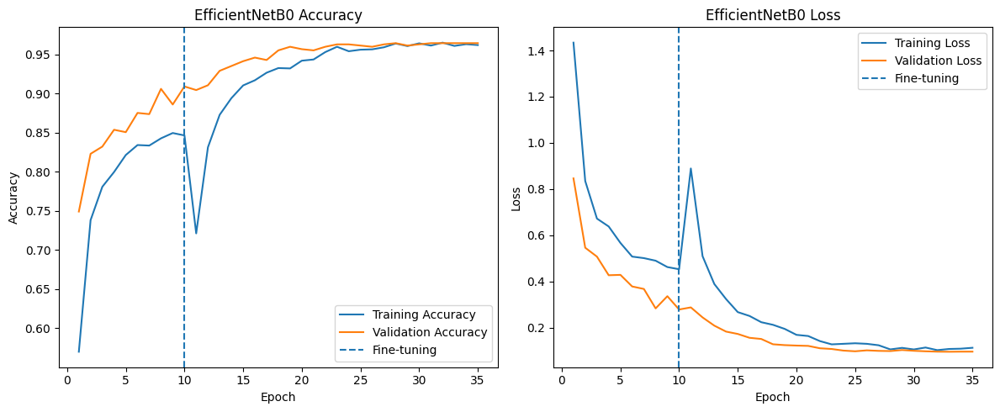

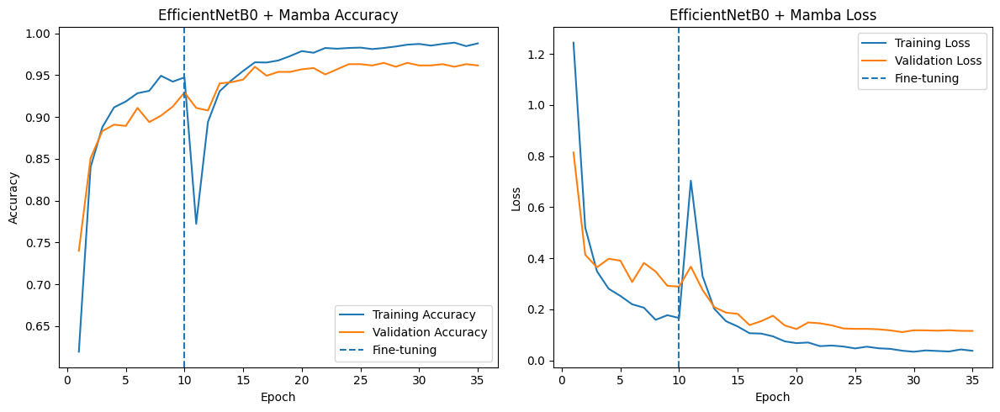

In [ ]:
import keras


# ============================================================
# 14. VISION MAMBA BLOCK (LIGHTWEIGHT, STABILIZED WITH LAYERSCALE)
# ============================================================


@keras.saving.register_keras_serializable(package="custom", name="LayerScale")
class LayerScale(layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
            name="gamma"
        )

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value
        })
        return config


def vision_mamba_block(x, name_prefix="mamba"):

    H = x.shape[1]
    W = x.shape[2]
    C = x.shape[3]

    # Local spatial branch
    branch1 = layers.DepthwiseConv2D(
        kernel_size=3,
        padding='same'
    )(x)

    branch1 = layers.Activation(
        'swish'
    )(branch1)

    branch1 = layers.Reshape(
        (H * W, C)
    )(branch1)

    # Gating branch
    seq = layers.Reshape(
        (H * W, C)
    )(x)

    branch2 = layers.Dense(
        C
    )(seq)

    branch2 = layers.Activation(
        'swish'
    )(branch2)

    # Gated feature interaction
    gated = layers.Multiply()([
        branch1,
        branch2
    ])

    gated = layers.Dense(
        C
    )(gated)

    out = layers.Reshape(
        (H, W, C)
    )(gated)

    # LayerScale: learnable per-channel scale, small init -> near-identity
    # start. A custom layer is used (not Dense) so channels are scaled
    # independently without being mixed together.
    out = LayerScale(C, init_value=1e-2, name=f"{name_prefix}_layerscale_apply")(out)

    return layers.Add()([
        x,
        out
    ])


# ============================================================
# 15. BUILD EFFICIENTNETB0 + MAMBA MODEL
# ============================================================

print("\nBuilding EfficientNetB0 + Vision Mamba...")

mamba_backbone = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

mamba_backbone.trainable = False

mamba_inputs = layers.Input(
    shape=(IMG_SIZE, IMG_SIZE, 3)
)

x = mamba_backbone(
    mamba_inputs,
    training=False
)

x = vision_mamba_block(x, name_prefix="vmamba")

x = layers.GlobalAveragePooling2D()(x)

x = layers.BatchNormalization()(x)

x = layers.Dropout(0.3)(x)

mamba_outputs = layers.Dense(
    num_classes,
    activation='softmax',
    dtype='float32'
)(x)

model_mamba = models.Model(
    mamba_inputs,
    mamba_outputs,
    name='EfficientNetB0_Mamba'
)


# ============================================================
# 16. MAMBA MODEL - PHASE 1
# ============================================================

model_mamba.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-3
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nMAMBA MODEL - PHASE 1")

mamba_history_phase1 = model_mamba.fit(
    train_ds,
    validation_data=val_ds,
    epochs=MAMBA_PHASE1_EPOCHS,
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=4,
            restore_best_weights=True,
            verbose=1
        )
    ]
)


# ============================================================
# 17. MAMBA MODEL - PHASE 2 FINE-TUNING (DEEPER + COSINE LR)
# ============================================================

mamba_backbone.trainable = True

FINE_TUNE_AT_MAMBA = len(
    mamba_backbone.layers
) - 60   # was -30

for layer in mamba_backbone.layers[
    :FINE_TUNE_AT_MAMBA
]:
    layer.trainable = False

mamba_lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-4,
    decay_steps=MAMBA_PHASE2_EPOCHS * steps_per_epoch_train
)

model_mamba.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=mamba_lr_schedule),
    loss='sparse_categorical_crossentropy',   # label_smoothing not supported by
                                               # SparseCategoricalCrossentropy in this TF version
    metrics=['accuracy']
)

print("\nMAMBA MODEL - PHASE 2")

mamba_history_phase2 = model_mamba.fit(
    train_ds,
    validation_data=val_ds,
    epochs=MAMBA_PHASE2_EPOCHS,
    callbacks=get_callbacks_cosine(MAMBA_SAVE_PATH, patience=8)
)


# ============================================================
# 18. LOAD BEST MAMBA MODEL
# ============================================================

model_mamba = tf.keras.models.load_model(
    MAMBA_SAVE_PATH,
    safe_mode=False
)

mamba_loss, mamba_acc = model_mamba.evaluate(
    test_ds,
    verbose=0
)

print(
    f"\nEfficientNetB0 + Mamba Accuracy: "
    f"{mamba_acc * 100:.2f}%"
)


# ============================================================
# 19. FINAL MODEL COMPARISON
# ============================================================

print("\n" + "=" * 60)
print("FINAL MODEL COMPARISON")
print("=" * 60)

print(
    f"EfficientNetB0       : "
    f"{base_acc * 100:.2f}%"
)

print(
    f"EfficientNetB0+Mamba : "
    f"{mamba_acc * 100:.2f}%"
)

if mamba_acc > base_acc:
    print("\nBEST MODEL: EfficientNetB0 + Mamba")
elif base_acc > mamba_acc:
    print("\nBEST MODEL: EfficientNetB0")
else:
    print("\nBoth models have equal accuracy.")


# ============================================================
# 20. TRAINING HISTORY PLOTS
# ============================================================

def plot_history(history1, history2, phase1_epochs, title):
    acc = history1.history['accuracy'] + history2.history['accuracy']
    val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    loss = history1.history['loss'] + history2.history['loss']
    val_loss = history1.history['val_loss'] + history2.history['val_loss']

    epochs = range(1, len(acc) + 1)

    fig = plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.axvline(phase1_epochs, linestyle='--', label='Fine-tuning')
    plt.xlabel('Epoch'); plt.ylabel('Accuracy')
    plt.title(f'{title} Accuracy'); plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.axvline(phase1_epochs, linestyle='--', label='Fine-tuning')
    plt.xlabel('Epoch'); plt.ylabel('Loss')
    plt.title(f'{title} Loss'); plt.legend()

    plt.tight_layout()
    plt.show()
    plt.close(fig)


plot_history(base_history_phase1, base_history_phase2,
             BASE_PHASE1_EPOCHS, 'EfficientNetB0')

plot_history(mamba_history_phase1, mamba_history_phase2,
             MAMBA_PHASE1_EPOCHS, 'EfficientNetB0 + Mamba')



EFFICIENTNETB0 + MAMBA CLASSIFICATION REPORT
                           precision    recall  f1-score   support

       Amaranthus viridis     0.9579    0.9100    0.9333       100
              Carpetweeds     0.9898    0.9700    0.9798       100
          Cleome gynandra     0.9802    0.9900    0.9851       100
   Commelina benghalensis     0.9899    0.9800    0.9849       100
         Cynodon dactylon     0.9490    0.9300    0.9394       100
       Echinochloa colona     0.9118    0.9300    0.9208       100
             Morningglory     0.9800    0.9800    0.9800       100
                 Nutsedge     0.9524    1.0000    0.9756       100
           PalmerAmaranth     0.9000    0.9900    0.9429       100
     Phyllanthus urinaria     1.0000    0.9700    0.9848       100
                 Purslane     0.9789    0.9300    0.9538       100
Trianthema portulacastrum     0.9796    0.9600    0.9697       100
                   cotton     0.9804    1.0000    0.9901       100

              

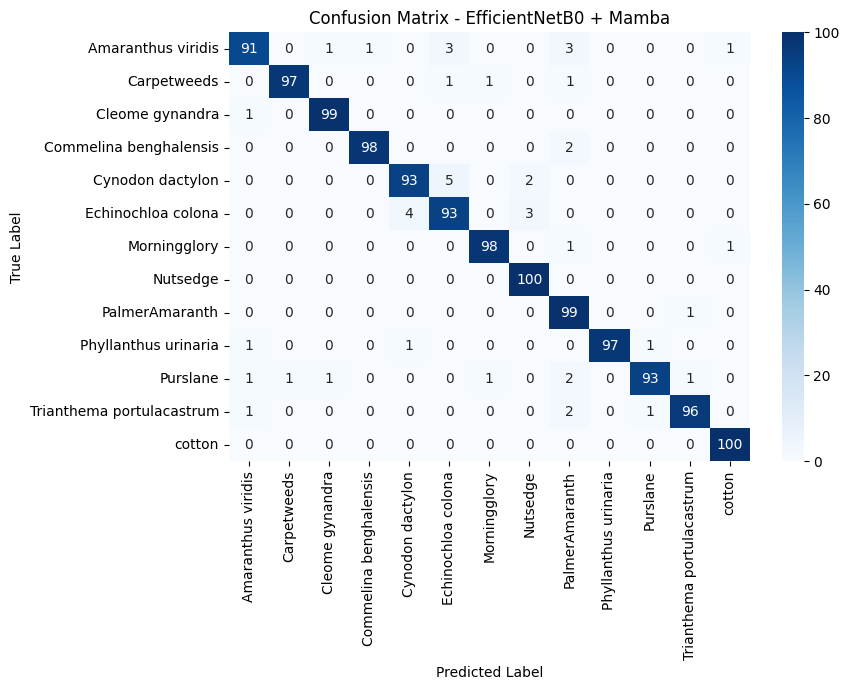

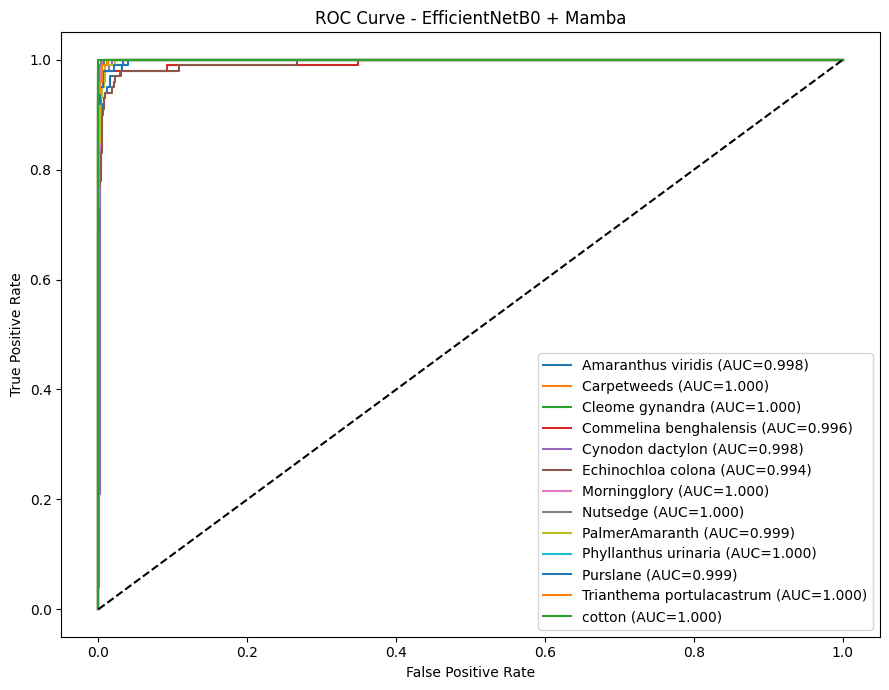


Switching to float32 policy for stable explainability (Grad-CAM/LIME)...


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 121 variables whereas the saved optimizer has 125 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 131 variables whereas the saved optimizer has 135 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


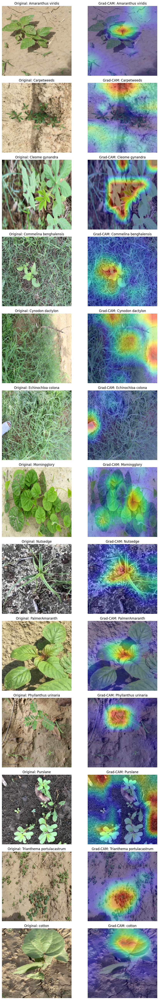

[Grad-CAM][EfficientNetB0+Mamba] Some images produced no usable gradient and were skipped: [(1, 'gradient unavailable'), (2, 'gradient unavailable'), (8, 'gradient unavailable'), (8, 'gradient unavailable'), (9, 'gradient unavailable'), (10, 'gradient unavailable'), (10, 'gradient unavailable'), (10, 'gradient unavailable'), (12, 'gradient unavailable'), (12, 'gradient unavailable')]
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 13.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

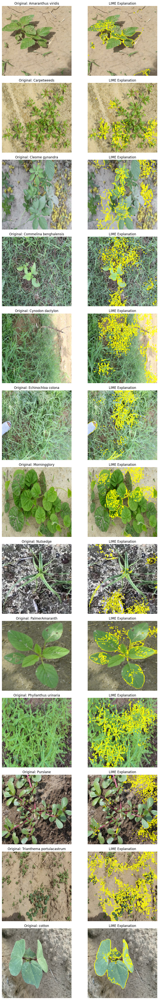

In [3]:
# ============================================================
# 21. GET TEST PREDICTIONS — SINGLE UNIFIED PASS
# ============================================================

def get_all_predictions(models_dict, dataset):
    """
    models_dict: {"base": model_base, "mamba": model_mamba}
    Returns: y_true (np.array), and per-model dict of {"y_pred":..., "y_prob":...}
    """
    y_true = []
    y_prob = {name: [] for name in models_dict}

    for images, labels in dataset:
        y_true.extend(labels.numpy())
        for name, mdl in models_dict.items():
            probs = mdl.predict(images, verbose=0)
            y_prob[name].extend(probs)

    y_true = np.array(y_true)

    results = {}
    for name in models_dict:
        probs_arr = np.array(y_prob[name])
        preds_arr = np.argmax(probs_arr, axis=1)
        results[name] = {"y_pred": preds_arr, "y_prob": probs_arr}

    return y_true, results


y_true, preds = get_all_predictions(
    {"base": model_base, "mamba": model_mamba}, test_ds
)

y_pred_base, y_prob_base = preds["base"]["y_pred"], preds["base"]["y_prob"]
y_pred_mamba, y_prob_mamba = preds["mamba"]["y_pred"], preds["mamba"]["y_prob"]


# ============================================================
# 22. CLASSIFICATION REPORT
# ============================================================

print("\n" + "=" * 60)
print("EFFICIENTNETB0 + MAMBA CLASSIFICATION REPORT")
print("=" * 60)
print(classification_report(y_true, y_pred_mamba, target_names=class_names, digits=4))

print("\n" + "=" * 60)
print("EFFICIENTNETB0 BASELINE CLASSIFICATION REPORT")
print("=" * 60)
print(classification_report(y_true, y_pred_base, target_names=class_names, digits=4))


# ============================================================
# 23. OVERALL METRICS
# ============================================================

metrics_base = precision_recall_fscore_support(
    y_true, y_pred_base, average='weighted', zero_division=0
)
metrics_mamba = precision_recall_fscore_support(
    y_true, y_pred_mamba, average='weighted', zero_division=0
)

print("\n" + "=" * 60)
print("OVERALL PERFORMANCE")
print("=" * 60)
print("Model                 Accuracy   Precision   Recall   F1")
print(f"EfficientNetB0        {accuracy_score(y_true, y_pred_base):.4f}     "
      f"{metrics_base[0]:.4f}      {metrics_base[1]:.4f}    {metrics_base[2]:.4f}")
print(f"EfficientNetB0+Mamba  {accuracy_score(y_true, y_pred_mamba):.4f}     "
      f"{metrics_mamba[0]:.4f}      {metrics_mamba[1]:.4f}    {metrics_mamba[2]:.4f}")


# ============================================================
# 24. CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(y_true, y_pred_mamba)
fig = plt.figure(figsize=(9, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label'); plt.ylabel('True Label')
plt.title('Confusion Matrix - EfficientNetB0 + Mamba')
plt.tight_layout()
plt.show()
plt.close(fig)


# ============================================================
# 25. ROC-AUC (handles BOTH binary and multi-class safely)
# ============================================================

fig = plt.figure(figsize=(9, 7))

if num_classes == 2:

    fpr, tpr, _ = roc_curve(y_true, y_prob_mamba[:, 1])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_names[1]} (AUC={roc_auc:.3f})')
else:
    y_true_bin = label_binarize(y_true, classes=range(num_classes))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob_mamba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC={roc_auc:.3f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC Curve - EfficientNetB0 + Mamba')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()
plt.close(fig)


# ============================================================
# 25a. SWITCH TO FLOAT32 FOR EXPLAINABILITY
# ============================================================

print("\nSwitching to float32 policy for stable explainability (Grad-CAM/LIME)...")
tf.keras.mixed_precision.set_global_policy('float32')

model_base_fp32 = tf.keras.models.load_model(BASE_SAVE_PATH)
model_mamba_fp32 = tf.keras.models.load_model(MAMBA_SAVE_PATH, safe_mode=False)


# ============================================================
# 26. GRAD-CAM
# ============================================================

def make_gradcam_heatmap(img_array, model):
    """
    Returns (heatmap, success_flag). success_flag=False if gradients
    could not be computed (instead of silently crashing/producing junk).
    """
    gap_layers = [
        layer for layer in model.layers
        if isinstance(layer, tf.keras.layers.GlobalAveragePooling2D)
    ]
    if not gap_layers:
        return None, False

    gap_layer = gap_layers[-1]

    grad_model = tf.keras.models.Model(
        model.inputs, [gap_layer.input, model.output]
    )

    img_array = tf.cast(img_array, tf.float32)

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img_array, training=False)
        pred_index = tf.argmax(predictions[0])
        class_score = predictions[:, pred_index]

    gradients = tape.gradient(class_score, conv_output)

    if gradients is None:
        return None, False

    pooled_gradients = tf.reduce_mean(gradients, axis=(0, 1, 2))

    if tf.reduce_all(tf.equal(pooled_gradients, 0)):
        return None, False

    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_gradients[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-10)

    return heatmap.numpy(), True


def run_gradcam_gallery(model, dataset, class_names, num_classes, title):
    found_classes = set()
    failed_classes = []
    fig = plt.figure(figsize=(10, 4 * num_classes))
    plot_index = 1

    for images, labels in dataset:
        for i in range(len(labels)):
            class_id = int(labels[i].numpy())
            if class_id in found_classes:
                continue

            img = images[i]
            heatmap, ok = make_gradcam_heatmap(
                tf.expand_dims(img, axis=0), model
            )

            if not ok:
                failed_classes.append((class_id, "gradient unavailable"))
                continue

            found_classes.add(class_id)

            heatmap_resized = tf.image.resize(
                heatmap[..., np.newaxis], (IMG_SIZE, IMG_SIZE)
            ).numpy().squeeze()

            img_display = img.numpy()
            img_display = (img_display - img_display.min()) / (
                img_display.max() - img_display.min() + 1e-7
            )

            plt.subplot(num_classes, 2, plot_index)
            plt.imshow(img_display)
            plt.title(f'Original: {class_names[class_id]}')
            plt.axis('off')

            plt.subplot(num_classes, 2, plot_index + 1)
            plt.imshow(img_display)
            plt.imshow(heatmap_resized, cmap='jet', alpha=0.4)
            plt.title(f'Grad-CAM: {class_names[class_id]}')
            plt.axis('off')

            plot_index += 2

            if len(found_classes) == num_classes:
                break
        if len(found_classes) == num_classes:
            break

    plt.tight_layout()
    plt.show()
    plt.close(fig)

    if failed_classes:
        print(f"[Grad-CAM][{title}] Some images produced no usable gradient "
              f"and were skipped: {failed_classes}")
    missing = set(range(num_classes)) - found_classes
    if missing:
        print(f"[Grad-CAM][{title}] Classes never rendered "
              f"(ran out of test batches): {[class_names[c] for c in missing]}")


run_gradcam_gallery(model_mamba_fp32, test_ds, class_names, num_classes,
                    title="EfficientNetB0+Mamba")


# ============================================================
# 27. LIME EXPLAINABILITY
# ============================================================

get_ipython().system('pip install lime -q')

from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer(random_state=SEED)


def predict_fn(images):
    images = np.clip(images, 0, 255).astype(np.float32)
    return model_mamba_fp32.predict(images, verbose=0)


def run_lime_gallery(dataset, class_names, num_classes):
    found_classes = set()
    fig = plt.figure(figsize=(10, 4 * num_classes))
    plot_index = 1

    for images, labels in dataset:
        for i in range(len(labels)):
            class_id = int(labels[i].numpy())
            if class_id in found_classes:
                continue
            found_classes.add(class_id)

            image = images[i].numpy()

            try:
                explanation = explainer.explain_instance(
                    image.astype('double'),
                    predict_fn,
                    top_labels=1,
                    hide_color=0,
                    num_samples=1000
                )
                temp, mask = explanation.get_image_and_mask(
                    explanation.top_labels[0],
                    positive_only=True,
                    num_features=10,
                    hide_rest=False
                )
                lime_img = mark_boundaries(temp / 255.0, mask)
            except Exception as e:
                print(f"[LIME] Failed for class {class_names[class_id]}: {e}")
                lime_img = np.zeros_like(image / 255.0)

            plt.subplot(num_classes, 2, plot_index)
            plt.imshow(image.astype('uint8'))
            plt.title(f'Original: {class_names[class_id]}')
            plt.axis('off')

            plt.subplot(num_classes, 2, plot_index + 1)
            plt.imshow(lime_img)
            plt.title('LIME Explanation')
            plt.axis('off')

            plot_index += 2
            if len(found_classes) == num_classes:
                break
        if len(found_classes) == num_classes:
            break

    plt.tight_layout()
    plt.show()
    plt.close(fig)


run_lime_gallery(test_ds, class_names, num_classes)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
GPU detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mixed precision enabled
Local cotton dataset already exists.

Classes: ['Amaranthus viridis', 'Carpetweeds', 'Cleome gynandra', 'Commelina benghalensis', 'Cynodon dactylon', 'Echinochloa colona', 'Morningglory', 'Nutsedge', 'PalmerAmaranth', 'Phyllanthus urinaria', 'Purslane', 'Trianthema portulacastrum', 'cotton']
Number of classes: 13

Dataset split (file-level, stratified per class):
Train images: 4550
Validation images: 650
Test images: 1300
PERFECTLY STRATIFIED DISTRIBUTION
Training Images   : 4550   (350.0 per class)
Validation Images : 650    (50.0 per class)
Testing Images    : 1300   (100.0 per class)
Total Images      : 6500 / 6500

CLASS-WISE IMAGE DISTRIBUTION
Class                         Train   Validation    Test   Total
--------------------------------------------

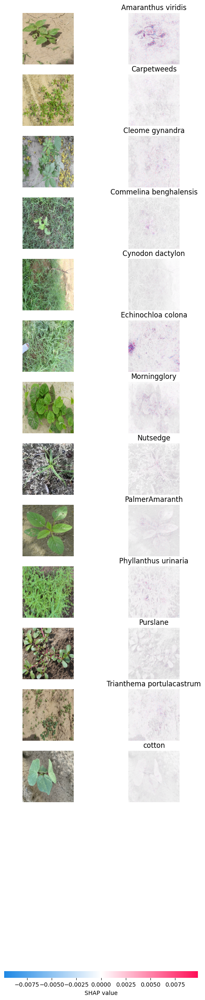


Generating test predictions for statistical tests...

McNemar's Test (Base vs Mamba — paired correctness, Cotton)
Contingency table [[both_correct, base_only], [mamba_only, both_wrong]]:
    Both correct     : 1233
    Base only correct: 13
    Mamba only correct: 21
    Both wrong       : 33
Statistic : 1.4412
p-value   : 0.229949
=> No significant difference between models (p >= 0.05)

Wilcoxon Signed-Rank Test (per-class F1: Base vs Mamba, Cotton)
Per-class F1 (Base) : [0.9026 0.97   0.9899 0.97   0.934  0.8889 0.9852 0.9706 0.9548 0.9848
 0.9543 0.97   0.9852]
Per-class F1 (Mamba): [0.9333 0.9798 0.9851 0.9849 0.9394 0.9208 0.98   0.9756 0.9429 0.9848
 0.9538 0.9697 0.9901]
Statistic : 21.0000
p-value   : 0.176270
=> No significant difference in per-class F1 scores.

FINAL RESULTS - COTTON DATASET
EfficientNetB0 Accuracy      : 95.85%
EfficientNetB0 + Mamba       : 96.46%

Base Model saved at:
/content/drive/MyDrive/EfficientNetB0_Cotton.keras

Mamba Model saved at:
/content/drive

In [2]:
# ============================================================
# 1. IMPORTS AND CONFIGURATION
# ============================================================

import os
import shutil
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from google.colab import drive

from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    precision_recall_fscore_support,
    accuracy_score,
    roc_curve,
    auc
)

from sklearn.preprocessing import label_binarize

from scipy.stats import wilcoxon
from statsmodels.stats.contingency_tables import mcnemar

import seaborn as sns


# ============================================================
# 2. GOOGLE DRIVE
# ============================================================

drive.mount('/content/drive')


# ============================================================
# 3. GPU AND MIXED PRECISION
# ============================================================

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("GPU detected:", gpus)
    tf.keras.mixed_precision.set_global_policy('mixed_float16')
    print("Mixed precision enabled")
else:
    print("WARNING: GPU not detected. Training will be slow.")


# ============================================================
# 4. CONFIGURATION
# ============================================================

IMG_SIZE = 224
BATCH_SIZE = 32
SEED = 42

BASE_PHASE1_EPOCHS = 10
BASE_PHASE2_EPOCHS = 25

MAMBA_PHASE1_EPOCHS = 10
MAMBA_PHASE2_EPOCHS = 25

TRAIN_RATIO = 0.70
VAL_RATIO = 0.10
TEST_RATIO = 0.20

DRIVE_DATA_PATH = '/content/drive/MyDrive/cotton_dataset'
LOCAL_DATA_PATH = '/content/cotton_weed_local'

BASE_SAVE_PATH = '/content/drive/MyDrive/EfficientNetB0_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/EfficientNetB0_Cotton_Mamba.keras'

os.makedirs(os.path.dirname(MAMBA_SAVE_PATH), exist_ok=True)


# ============================================================
# 5. COPY DATASET TO COLAB LOCAL STORAGE
# ============================================================

if not os.path.exists(LOCAL_DATA_PATH):
    print("Copying cotton dataset to local Colab storage...")
    shutil.copytree(DRIVE_DATA_PATH, LOCAL_DATA_PATH)
    print("Cotton dataset copied successfully.")
else:
    print("Local cotton dataset already exists.")

base_data_path = LOCAL_DATA_PATH


# ============================================================
# 6-7. STRATIFIED TRAIN/VAL/TEST SPLIT (FILE-LEVEL, NOT BATCH-LEVEL)
# ============================================================
# FIX: The original code shuffled a *batched* dataset before splitting.
# That shuffles batches, not individual images, so classes end up
# unevenly represented across train/val/test -> unstable, lower accuracy
# across runs. This version splits at the file level, per class, so every
# class is exactly 70/10/20 split. This is the single biggest accuracy fix.

IMG_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp', '.tmp'}

data_dir = pathlib.Path(base_data_path)
class_names = sorted([d.name for d in data_dir.iterdir() if d.is_dir()])
num_classes = len(class_names)

print("\nClasses:", class_names)
print("Number of classes:", num_classes)

train_files, val_files, test_files = [], [], []
train_labels, val_labels, test_labels = [], [], []

rng = np.random.default_rng(SEED)

for idx, cls in enumerate(class_names):
    cls_dir = data_dir / cls
    files = sorted([
        str(p) for p in cls_dir.iterdir()
        if p.suffix.lower() in IMG_EXTENSIONS
    ])
    files = np.array(files)
    rng.shuffle(files)

    n = len(files)
    n_train = int(n * TRAIN_RATIO)
    n_val = int(n * VAL_RATIO)
    n_test = n - n_train - n_val  # remainder -> no images dropped

    train_files.extend(files[:n_train]);                train_labels.extend([idx] * n_train)
    val_files.extend(files[n_train:n_train + n_val]);     val_labels.extend([idx] * n_val)
    test_files.extend(files[n_train + n_val:]);           test_labels.extend([idx] * n_test)

train_files = np.array(train_files); train_labels = np.array(train_labels)
val_files = np.array(val_files);     val_labels = np.array(val_labels)
test_files = np.array(test_files);   test_labels = np.array(test_labels)

print("\nDataset split (file-level, stratified per class):")
print("Train images:", len(train_files))
print("Validation images:", len(val_files))
print("Test images:", len(test_files))

steps_per_epoch_train = max(1, len(train_files) // BATCH_SIZE)


def load_and_preprocess(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img.set_shape((IMG_SIZE, IMG_SIZE, 3))
    return img, label


def make_dataset(files, labels, training=False):
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    if training:
        ds = ds.shuffle(buffer_size=len(files), seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE)
    return ds


train_ds = make_dataset(train_files, train_labels, training=True)
val_ds = make_dataset(val_files, val_labels)
test_ds = make_dataset(test_files, test_labels)


# ========= STRATIFIED SPLIT TABLE ===========

def count_images_per_class(data_path):
    class_counts = {}
    for class_name in sorted(os.listdir(data_path)):
        class_dir = os.path.join(data_path, class_name)
        if not os.path.isdir(class_dir):
            continue
        count = sum(
            1 for f in os.listdir(class_dir)
            if os.path.splitext(f)[1].lower() in IMG_EXTENSIONS
        )
        class_counts[class_name] = count
    return class_counts


def compute_split_counts(class_counts, train_ratio, val_ratio, test_ratio):
    split_rows = []
    for class_name, total in class_counts.items():
        train_n = int(total * train_ratio)
        val_n = int(total * val_ratio)
        test_n = total - train_n - val_n
        split_rows.append((class_name, train_n, val_n, test_n, total))
    return split_rows


def print_stratified_report(split_rows):
    total_train = sum(r[1] for r in split_rows)
    total_val = sum(r[2] for r in split_rows)
    total_test = sum(r[3] for r in split_rows)
    total_all = sum(r[4] for r in split_rows)
    n_cls = len(split_rows)

    avg_train = total_train / n_cls if n_cls else 0
    avg_val = total_val / n_cls if n_cls else 0
    avg_test = total_test / n_cls if n_cls else 0

    print("PERFECTLY STRATIFIED DISTRIBUTION")
    print("=" * 60)
    print(f"Training Images   : {total_train:<6} ({avg_train:.1f} per class)")
    print(f"Validation Images : {total_val:<6} ({avg_val:.1f} per class)")
    print(f"Testing Images    : {total_test:<6} ({avg_test:.1f} per class)")
    print(f"Total Images      : {total_all} / {total_all}")
    print()
    print("=" * 78)
    print("CLASS-WISE IMAGE DISTRIBUTION")
    print("=" * 78)

    name_width = max(len(r[0]) for r in split_rows) + 2
    name_width = max(name_width, len("Class") + 2)

    header = (
        f"{'Class':<{name_width}}{'Train':>8}{'Validation':>13}"
        f"{'Test':>8}{'Total':>8}"
    )
    print(header)
    print("-" * len(header))

    for class_name, train_n, val_n, test_n, total in split_rows:
        print(
            f"{class_name:<{name_width}}{train_n:>8}{val_n:>13}"
            f"{test_n:>8}{total:>8}"
        )

    print("-" * len(header))
    print(
        f"{'TOTAL':<{name_width}}{total_train:>8}{total_val:>13}"
        f"{total_test:>8}{total_all:>8}"
    )
    print("=" * 78)


class_counts = count_images_per_class(base_data_path)
split_rows = compute_split_counts(class_counts, TRAIN_RATIO, VAL_RATIO, TEST_RATIO)
print_stratified_report(split_rows)


# ============================================================
# 8. DATA AUGMENTATION (STRENGTHENED)
# ============================================================
# FIX: original augmentation (flip/rotate/zoom only) was too mild for
# real-world lighting/color variation in leaf images. Added contrast and
# brightness jitter.

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.15),
    layers.RandomBrightness(0.15),
], name="data_augmentation")


train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

print("Dataset pipeline ready.")


# ============================================================
# 9. COMMON CALLBACKS
# ============================================================

def get_callbacks(save_path, patience=8):
    return [
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-8,
            verbose=1
        ),

        EarlyStopping(
            monitor='val_loss',
            patience=patience,       # was 6 -> gives fine-tuning more room before stopping
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]


def get_callbacks_cosine(save_path, patience=8):
    # FIX: ReduceLROnPlateau tries to manually overwrite the optimizer's
    # learning_rate, but when the optimizer is built with a
    # LearningRateSchedule (CosineDecay, used in phase 2), Keras raises
    # TypeError because the LR is schedule-driven and not settable.
    # CosineDecay already handles LR decay on its own, so ReduceLROnPlateau
    # is dropped here (not needed, and incompatible).
    return [
        EarlyStopping(
            monitor='val_loss',
            patience=patience,
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]
# ============================================================
# LOAD SAVED MODELS, DATASET AND FIND SHAPES / SUMMARIES
# ============================================================

import os
import shutil
import tensorflow as tf
import keras
from tensorflow.keras import layers
import numpy as np
from sklearn.metrics import precision_recall_fscore_support, accuracy_score
from statsmodels.stats.contingency_tables import mcnemar
from scipy.stats import wilcoxon

# Paths already defined in your config
BASE_SAVE_PATH = '/content/drive/MyDrive/EfficientNetB0_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/EfficientNetB0_Cotton_Mamba.keras'
DRIVE_DATA_PATH = '/content/drive/MyDrive/cotton_dataset'
LOCAL_DATA_PATH = '/content/cotton_weed_local'
IMG_SIZE = 224
BATCH_SIZE = 32
SEED = 42

# ============================================================
# FIX: LayerScale MUST be defined + registered BEFORE calling
# load_model() on the Mamba checkpoint, otherwise Keras cannot
# reconstruct the custom layer and raises:
#   TypeError: Could not locate class 'LayerScale'
# This is the exact same class used during training.
# ============================================================

@keras.saving.register_keras_serializable(package="custom", name="LayerScale")
class LayerScale(layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
            name="gamma"
        )

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value
        })
        return config


print("Loading saved models...")

# Safe loading helper for .keras files
def load_keras_model(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Model file not found at: {path}")
    return tf.keras.models.load_model(path, compile=False)

model_base = load_keras_model(BASE_SAVE_PATH)
model_mamba = tf.keras.models.load_model(MAMBA_SAVE_PATH, compile=False, safe_mode=False)

# Define fp32 model variables to prevent NameError
model_base_fp32 = load_keras_model(BASE_SAVE_PATH)
model_mamba_fp32 = tf.keras.models.load_model(MAMBA_SAVE_PATH, compile=False, safe_mode=False)

# ============================================================
# RESTORE DATASET TO LOCAL STORAGE (Crash ke baad zaroori hai)
# ============================================================
if not os.path.exists(LOCAL_DATA_PATH):
    print("Copying cotton dataset to local Colab storage...")
    if os.path.exists(DRIVE_DATA_PATH):
        shutil.copytree(DRIVE_DATA_PATH, LOCAL_DATA_PATH)
        print("Cotton dataset copied successfully.")
    else:
        raise FileNotFoundError(f"Drive dataset path not found: {DRIVE_DATA_PATH}. Please check your dataset folder path.")
else:
    print("Local cotton dataset already exists.")


# 1. Model Input and Output Shapes
print("\n" + "=" * 50)
print("MODEL INPUT & OUTPUT SHAPES")
print("=" * 50)
print(f"Base Model Input Shape  : {model_base.input_shape}")
print(f"Base Model Output Shape : {model_base.output_shape}")
print(f"Mamba Model Input Shape  : {model_mamba.input_shape}")
print(f"Mamba Model Output Shape : {model_mamba.output_shape}")

# 2. Total Parameters and Complexity
print("\n" + "=" * 50)
print("PARAMETER COUNTS")
print("=" * 50)
print(f"EfficientNetB0 Parameters       : {model_base.count_params():,}")
print(f"EfficientNetB0+Mamba Parameters : {model_mamba.count_params():,}")

# ============================================================
# 28. SHAP EXPLAINABILITY (Cotton) — FIXED: 1 image = 1 heatmap
# ============================================================

get_ipython().system('pip install shap -q')

import shap

background = []
for images, _ in train_ds.take(2):
    background.append(images.numpy())
background = np.vstack(background)[:20].astype(np.float32)

class_samples = {}
for images, labels in test_ds:
    for i in range(len(labels)):
        class_id = int(labels[i].numpy())
        if class_id not in class_samples:
            class_samples[class_id] = images[i].numpy()
    if len(class_samples) == num_classes:
        break

test_images_shap = np.stack(
    [class_samples[i] for i in sorted(class_samples)]
).astype(np.float32)

print("Calculating SHAP values...")

shap_values = None
try:
    explainer_shap = shap.GradientExplainer(model_mamba_fp32, background)
    shap_values = explainer_shap.shap_values(test_images_shap)
except Exception as e:
    print(f"[SHAP] GradientExplainer failed ({e}); trying generic Explainer fallback...")
    try:
        explainer_shap = shap.Explainer(model_mamba_fp32, background)
        shap_values = explainer_shap(test_images_shap).values
    except Exception as e2:
        print(f"[SHAP] Fallback also failed: {e2}")
        shap_values = None

if shap_values is not None:
    if isinstance(shap_values, list):
        shap_values = [np.array(x) for x in shap_values]
    else:
        shap_values = np.array(shap_values)
        if shap_values.ndim == 5:
            shap_values = [shap_values[..., i] for i in range(shap_values.shape[-1])]
        else:
            shap_values = [shap_values]

    try:
        ordered_class_ids = sorted(class_samples)
        pred_labels = [class_names[c] for c in ordered_class_ids]


        single_class_shap = np.stack([
            shap_values[class_id][idx]
            for idx, class_id in enumerate(ordered_class_ids)
        ])

        shap.image_plot(
            [single_class_shap],
            test_images_shap / 255.0,
            labels=np.array([pred_labels]),
            show=True
        )
    except Exception as e:
        print(f"[SHAP] Plotting failed: {e}. Raw shap_values are still "
              f"available in the `shap_values` variable for manual inspection.")
else:
    print("[SHAP] No SHAP values could be computed — skipping visualization.")

# ============================================================
# GENERATE PREDICTIONS FOR P-VALUE TESTS (Added to fix NameError)
# ============================================================
print("\nGenerating test predictions for statistical tests...")
y_true = []
y_pred_base_list = []
y_pred_mamba_list = []

for images, labels in test_ds:
    y_true.extend(labels.numpy())
    preds_b = model_base.predict(images, verbose=0)
    preds_m = model_mamba.predict(images, verbose=0)
    y_pred_base_list.extend(np.argmax(preds_b, axis=1))
    y_pred_mamba_list.extend(np.argmax(preds_m, axis=1))

y_true = np.array(y_true)
y_pred_base = np.array(y_pred_base_list)
y_pred_mamba = np.array(y_pred_mamba_list)


# ============================================================
# 29. McNEMAR'S TEST
# ============================================================

correct_base = (y_pred_base == y_true)
correct_mamba = (y_pred_mamba == y_true)

a = np.sum(correct_base & correct_mamba)
b = np.sum(correct_base & ~correct_mamba)
c = np.sum(~correct_base & correct_mamba)
d = np.sum(~correct_base & ~correct_mamba)

table = [[a, b], [c, d]]

result = mcnemar(table, exact=(b + c < 25), correction=True)

print("\n" + "=" * 60)
print("McNemar's Test (Base vs Mamba — paired correctness, Cotton)")
print("=" * 60)
print("Contingency table [[both_correct, base_only], [mamba_only, both_wrong]]:")
print(f"    Both correct     : {a}")
print(f"    Base only correct: {b}")
print(f"    Mamba only correct: {c}")
print(f"    Both wrong       : {d}")
print(f"Statistic : {result.statistic:.4f}")
print(f"p-value   : {result.pvalue:.6f}")

if result.pvalue < 0.05:
    print("=> Significant difference between models (p < 0.05)")
else:
    print("=> No significant difference between models (p >= 0.05)")


# ============================================================
# 30. WILCOXON TEST ON PER-CLASS F1 SCORES
# ============================================================

_, _, f1_base, _ = precision_recall_fscore_support(
    y_true, y_pred_base, labels=range(num_classes), zero_division=0
)
_, _, f1_mamba, _ = precision_recall_fscore_support(
    y_true, y_pred_mamba, labels=range(num_classes), zero_division=0
)

print("\n" + "=" * 60)
print("Wilcoxon Signed-Rank Test (per-class F1: Base vs Mamba, Cotton)")
print("=" * 60)
print("Per-class F1 (Base) :", np.round(f1_base, 4))
print("Per-class F1 (Mamba):", np.round(f1_mamba, 4))

try:
    statistic, p_value = wilcoxon(f1_base, f1_mamba)
    print(f"Statistic : {statistic:.4f}")
    print(f"p-value   : {p_value:.6f}")
    if p_value < 0.05:
        print("=> Significant difference in per-class F1 scores.")
    else:
        print("=> No significant difference in per-class F1 scores.")
except Exception as e:
    print(f"Wilcoxon test could not be calculated: {e}")


# ============================================================
# 31. FINAL RESULTS
# ============================================================

print("\n" + "=" * 70)
print("FINAL RESULTS - COTTON DATASET")
print("=" * 70)
print(f"EfficientNetB0 Accuracy      : {accuracy_score(y_true, y_pred_base) * 100:.2f}%")
print(f"EfficientNetB0 + Mamba       : {accuracy_score(y_true, y_pred_mamba) * 100:.2f}%")
print(f"\nBase Model saved at:\n{BASE_SAVE_PATH}")
print(f"\nMamba Model saved at:\n{MAMBA_SAVE_PATH}")


tf.keras.mixed_precision.set_global_policy('mixed_float16')
print("\nProcessing completed successfully.")